# Exploratory Data Analysis Of Udemy Courses

#### Import Modules

In [1]:
import pandas as pd
import numpy as np
from scipy import stats

import matplotlib.pyplot as plt
import seaborn as sns

import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go

from sklearn.decomposition import PCA
from sklearn import datasets
from sklearn.preprocessing import StandardScaler
from sklearn import preprocessing

%matplotlib inline

#### Load the dataset 

In [2]:
df = pd.read_csv("Dataset/Development.csv")

In [3]:
df.head()

,id,title,url,is_paid,num_subscribers,avg_rating,avg_rating_recent,rating,num_reviews,num_published_lectures,num_published_practice_tests,created,published_time,discount_price__amount,discount_price__currency,price_detail__amount,price_detail__currency
0,567828,2020 Complete Python Bootcamp: From Zero to He...,/course/complete-python-bootcamp/,True,1086954,4.56326,4.56743,4.56743,314098,152,0,2015-07-29T00:12:23Z,2015-10-12T21:42:53Z,455.0,INR,8640,INR
1,625204,The Web Developer Bootcamp,/course/the-web-developer-bootcamp/,True,592474,4.64777,4.65291,4.65291,181621,405,0,2015-09-28T21:32:19Z,2015-11-02T21:13:27Z,455.0,INR,8640,INR
2,950390,Machine Learning A-Z™: Hands-On Python & R In ...,/course/machinelearning/,True,687330,4.55210,4.54932,4.54932,131007,323,0,2016-09-05T09:54:22Z,2016-09-13T21:43:44Z,455.0,INR,8640,INR
3,756150,Angular - The Complete Guide (2020 Edition),/course/the-complete-guide-to-angular-2/,True,417746,4.57687,4.58594,4.58594,128705,455,0,2016-02-08T17:02:55Z,2016-02-11T07:29:29Z,462.0,INR,8640,INR
4,533682,Java Programming Masterclass for Software Deve...,/course/java-the-complete-java-developer-course/,True,497195,4.56571,4.57203,4.57203,122306,400,0,2015-06-21T20:25:56Z,2015-07-21T22:01:13Z,455.0,INR,8640,INR


## Preprocessing Data

#### Remove redundant columns

In [4]:
df.rename(columns={"discount_price__amount": "discount_price_amount", "price_detail__amount": "price_detail_amount"},inplace=True)

# Remove redundant columns
redundant_columns = ["discount_price__currency", "price_detail__currency","url"]
df.drop(redundant_columns, inplace=True, axis=1)

#### Convert time to year, month format

In [5]:
# Convert time to year,month format

df["published_time"] = df["published_time"].apply(lambda x: x[:4]+'-'+x[5:7])

df["created"] = df["created"].apply(lambda x: x[:4]+'-'+x[5:7])

df = df.join(df['published_time'].str.split('-', 1, expand=True).rename(columns={0:'published_time_year', 1:'published_time_month'}))

df.drop(columns = "published_time",inplace=True)

#### Convert NA in discount_price_amount to 0

In [6]:
# Convert NA discounts to 0

print(f"Number of courses with no discount = {df['discount_price_amount'].isna().sum()}")

# Fill discount_price_amount = 0 for no discount
df['discount_price_amount']=df['discount_price_amount'].fillna(0)

print(f"Number of courses with no discount = {df['discount_price_amount'].isna().sum()}")

Number of courses with no discount = 168
Number of courses with no discount = 0


#### Preprocessed Data

In [7]:
df.head()

,id,title,is_paid,num_subscribers,avg_rating,avg_rating_recent,rating,num_reviews,num_published_lectures,num_published_practice_tests,created,discount_price_amount,price_detail_amount,published_time_year,published_time_month
0,567828,2020 Complete Python Bootcamp: From Zero to He...,True,1086954,4.56326,4.56743,4.56743,314098,152,0,2015-07,455.0,8640,2015,10
1,625204,The Web Developer Bootcamp,True,592474,4.64777,4.65291,4.65291,181621,405,0,2015-09,455.0,8640,2015,11
2,950390,Machine Learning A-Z™: Hands-On Python & R In ...,True,687330,4.55210,4.54932,4.54932,131007,323,0,2016-09,455.0,8640,2016,09
3,756150,Angular - The Complete Guide (2020 Edition),True,417746,4.57687,4.58594,4.58594,128705,455,0,2016-02,462.0,8640,2016,02
4,533682,Java Programming Masterclass for Software Deve...,True,497195,4.56571,4.57203,4.57203,122306,400,0,2015-06,455.0,8640,2015,07


#### Count of various columns

In [8]:
df["is_paid"].value_counts()

True    9932
Name: is_paid, dtype: int64

In [9]:
df.drop(columns = "is_paid",inplace=True)

In [10]:
df["num_published_practice_tests"].value_counts(sort=False)

# Most of the courses do not have practice tests

0    9756
1      77
2      66
3       7
4       3
5       4
6      19
Name: num_published_practice_tests, dtype: int64

In [11]:
df["discount_price_amount"].value_counts()

# There are 168 free courses after discount

455.0     9391
0.0        168
468.0       99
481.0       88
700.0       29
462.0       26
3200.0      18
800.0       13
488.0       10
474.0       10
1600.0       9
500.0        7
611.0        6
480.0        5
526.0        4
640.0        4
514.0        4
494.0        4
507.0        3
1120.0       3
720.0        3
560.0        3
3120.0       3
2400.0       2
1760.0       2
1840.0       2
1520.0       2
960.0        2
1040.0       1
2880.0       1
2320.0       1
630.0        1
880.0        1
1440.0       1
520.0        1
1200.0       1
1680.0       1
1920.0       1
2800.0       1
644.0        1
Name: discount_price_amount, dtype: int64

In [12]:
df["price_detail_amount"].value_counts()

# Original Price

8640     3240
1280     2122
6400      827
3200      648
1600      399
8000      384
1920      383
2560      270
6080      197
2240      193
4800      163
7680      130
3840      118
5120       96
8320       84
4480       83
2880       79
5760       74
3520       69
8960       67
5440       65
7040       57
6720       55
4160       53
7360       37
12800      12
9280        9
9600        7
11520       4
12480       2
10880       2
12160       1
11200       1
11840       1
Name: price_detail_amount, dtype: int64

## Data Visualization

#### Course distribution according to the years - Histogram

Course distribution according to the years


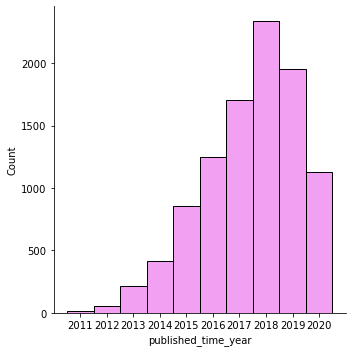

In [13]:
df_year_month = df[['published_time_year','published_time_month']].sort_values(['published_time_year','published_time_month'],ignore_index=True)
print("Course distribution according to the years")
sns.displot(df_year_month, x="published_time_year",color="violet")
plt.show()

#### Course distribution according to the year 2020 - Histogram

Course distribution according to the year 2020


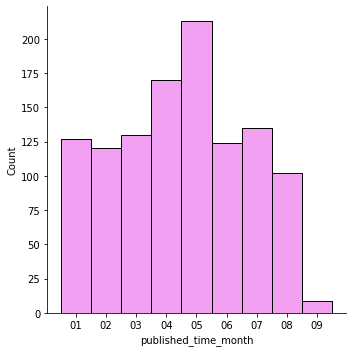

In [14]:
df_2020_month = df_year_month[df_year_month["published_time_year"] == "2020"]["published_time_month"]
print("Course distribution according to the year 2020")
sns.displot(df_2020_month,color="violet")
plt.show()

#### Heatmap 

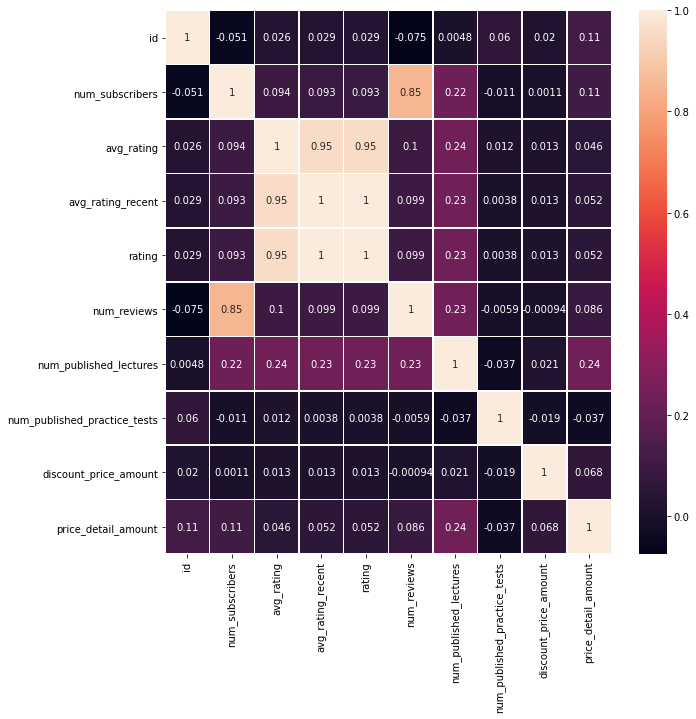

In [15]:
fig, ax = plt.subplots(figsize=(10,10))   

sns.heatmap(df.corr(), annot = True, linewidths=.5, ax=ax)
plt.show()

### Remove  avg_rating, avg_rating_recent, rating -> Only one column is required

#### Pairplot (Correlation) between avg_rating, avg_rating_recent, rating

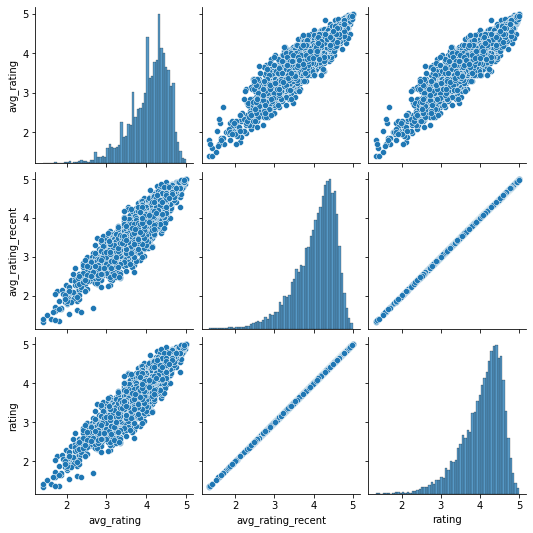

In [16]:
df_ratings = df[['avg_rating','avg_rating_recent','rating']]
sns.pairplot(df_ratings)
plt.show()

#### Box Plots of  avg_rating, avg_rating_recent, rating

In [17]:
df_ratings = pd.DataFrame(dict(
    linear=df["avg_rating"],
    inclusive=df["avg_rating_recent"],
    exclusive=df["rating"]
)).melt(var_name="quartilemethod")


fig = px.box(df_ratings, y="value", facet_col="quartilemethod", color="quartilemethod",
             boxmode="overlay", points='outliers')

fig.update_traces(quartilemethod="linear", jitter=0, col=1)
fig.update_traces(quartilemethod="inclusive", jitter=0, col=2)
fig.update_traces(quartilemethod="exclusive", jitter=0, col=3)

fig.show()

#### Drop avg_rating_recent, rating

In [18]:
# Drop avg_rating_recent,rating

df.drop(columns = ["avg_rating_recent","rating"],inplace=True)
df.head()

,id,title,num_subscribers,avg_rating,num_reviews,num_published_lectures,num_published_practice_tests,created,discount_price_amount,price_detail_amount,published_time_year,published_time_month
0,567828,2020 Complete Python Bootcamp: From Zero to He...,1086954,4.56326,314098,152,0,2015-07,455.0,8640,2015,10
1,625204,The Web Developer Bootcamp,592474,4.64777,181621,405,0,2015-09,455.0,8640,2015,11
2,950390,Machine Learning A-Z™: Hands-On Python & R In ...,687330,4.55210,131007,323,0,2016-09,455.0,8640,2016,09
3,756150,Angular - The Complete Guide (2020 Edition),417746,4.57687,128705,455,0,2016-02,462.0,8640,2016,02
4,533682,Java Programming Masterclass for Software Deve...,497195,4.56571,122306,400,0,2015-06,455.0,8640,2015,07


## Descriptive Statistics - Final Preprocessed Dataset

In [19]:
list(df.columns)

['id',
 'title',
 'num_subscribers',
 'avg_rating',
 'num_reviews',
 'num_published_lectures',
 'num_published_practice_tests',
 'created',
 'discount_price_amount',
 'price_detail_amount',
 'published_time_year',
 'published_time_month']

In [20]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9932 entries, 0 to 9931
Data columns (total 12 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   id                            9932 non-null   int64  
 1   title                         9932 non-null   object 
 2   num_subscribers               9932 non-null   int64  
 3   avg_rating                    9932 non-null   float64
 4   num_reviews                   9932 non-null   int64  
 5   num_published_lectures        9932 non-null   int64  
 6   num_published_practice_tests  9932 non-null   int64  
 7   created                       9932 non-null   object 
 8   discount_price_amount         9932 non-null   float64
 9   price_detail_amount           9932 non-null   int64  
 10  published_time_year           9932 non-null   object 
 11  published_time_month          9932 non-null   object 
dtypes: float64(2), int64(6), object(4)
memory usage: 931.2+ KB


In [21]:
df.shape

(9932, 12)

In [22]:
df.describe()

,id,num_subscribers,avg_rating,num_reviews,num_published_lectures,num_published_practice_tests,discount_price_amount,price_detail_amount
count,9.932000e+03,9.932000e+03,9932.000000,9932.000000,9932.000000,9932.000000,9932.000000,9932.000000
mean,1.579035e+06,7.410613e+03,4.072721,687.041986,61.520842,0.037857,458.835481,5254.321385
std,8.361819e+05,2.589134e+04,0.496794,5450.095041,71.216428,0.350750,157.669008,3112.627009
min,8.082000e+03,2.000000e+01,1.400000,8.000000,0.000000,0.000000,0.000000,1280.000000
25%,9.287770e+05,3.750000e+02,3.800000,24.000000,22.000000,0.000000,455.000000,1600.000000
50%,1.537401e+06,1.731000e+03,4.175220,60.000000,39.000000,0.000000,455.000000,6080.000000
75%,2.242264e+06,5.739000e+03,4.437500,212.000000,72.000000,0.000000,455.000000,8640.000000
max,3.473846e+06,1.086954e+06,5.000000,314098.000000,779.000000,6.000000,3200.000000,12800.000000


In [23]:
df.describe(include=np.object)

,title,created,published_time_year,published_time_month
count,9932,9932,9932,9932
unique,9894,110,10,12
top,Build Responsive Real World Websites with HTML...,2018-03,2018,05
freq,3,237,2339,927


## Insights from the data

#### Histogram of avg_rating

Histogram of avg_rating


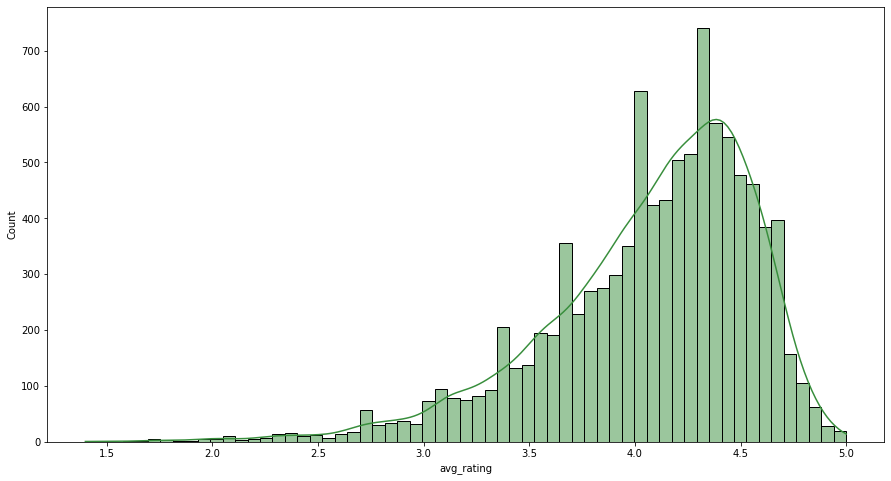

In [24]:
plt.figure(figsize=(15,8))

print("Histogram of avg_rating")
sns.histplot(df["avg_rating"] , label = "avg_rating",color='#388E3C',kde=True)
plt.show()

#### KDE Plot (Kernel Distribution Estimation Plot) of avg_rating

This is a Left Skewed Data


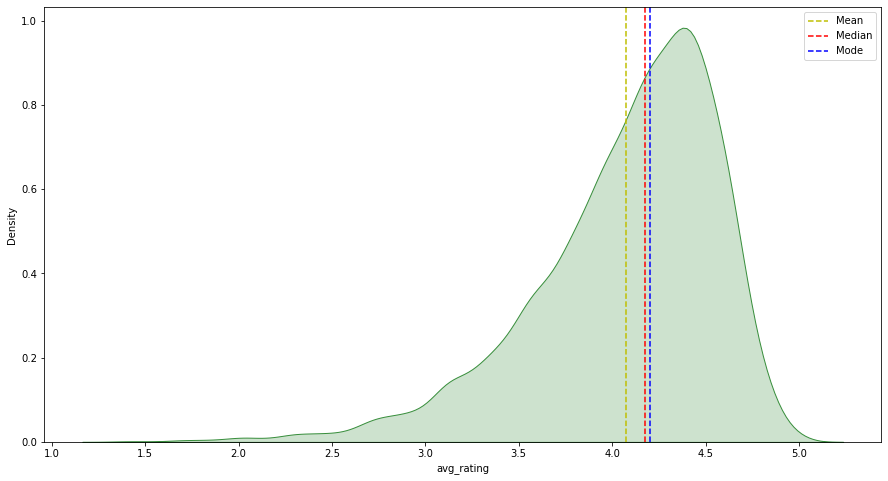

In [25]:
print("This is a Left Skewed Data")

plt.figure(figsize=(15,8))

sns.kdeplot(df["avg_rating"],label = "avg_rating",color='#388E3C',fill=True)

mean = np.mean(df["avg_rating"])
plt.axvline(mean,color='y', linestyle='--')

median = np.median(df["avg_rating"])
plt.axvline(median,color='r', linestyle='--')

mode = stats.mode(df["avg_rating"])
plt.axvline(mode.mode[0],color='b', linestyle='--')

plt.legend({'Mean':mean,'Median':median,'Mode':mode})
plt.show()

### Plots using PLOTLY

#### Cumulative Distribution Plot of avg_rating

In [26]:
print("Cumulative Distribution")
fig = px.histogram(df, x="avg_rating", nbins=1000,cumulative=True)
fig.show()

Cumulative Distribution


#### Box PLot of Average Ratings

In [27]:
print("Box PLot of Average Ratings")
px.box(df["avg_rating"],orientation='h')

Box PLot of Average Ratings


#### For the year 2020 and 2015 , num_subscribers vs num_published_lectures - Scatterplot

In [28]:
df_2020 = df[df["published_time_year"]  == "2020"][["num_published_lectures","num_subscribers"]]
df_2015 = df[df["published_time_year"]  == "2015"][["num_published_lectures","num_subscribers"]]

In [29]:
# Scatter Plot
# https://plotly.com/python/subplots/
print('''
    x = num_published_lectures
    y = num_subscribers
''')
# Scatter plot of num_subscribers vs num_published_lectures for year 2020
fig = px.scatter(
    df_2020.sample(), 
    x=df_2020.iloc[:,0], 
    y=df_2020.iloc[:,1],
    range_x=[0,500],
    range_y=[0,10000],
    trendline="lowess",
    trendline_color_override="chocolate")
fig.show()


# Scatter plot of num_subscribers vs num_published_lectures for year 2015
fig = px.scatter(
    df_2015.sample(), 
    x=df_2015.iloc[:,0], 
    y=df_2015.iloc[:,1],
    range_x=[0,500],
    range_y=[0,10000],
    trendline="lowess",
    trendline_color_override="chocolate")
fig.show()


# Sub plot for comparision between year 2015 and 2020

fig = make_subplots(rows=1, cols=2)

fig.add_trace(
    go.Scatter(
        x=df_2015.iloc[:,0], 
        y=df_2015.iloc[:,1],
        mode="markers",
    ),
    row=1, col=1
)

fig.add_trace(
    go.Scatter(
        x=df_2020.iloc[:,0], 
        y=df_2020.iloc[:,1],
        mode="markers",
    ),
    row=1, col=2
)



fig.update_layout(height=600, width=800, title_text="Subplot for comparision between year 2015 and 2020")
fig.show()


    x = num_published_lectures
    y = num_subscribers



### How is number of reviews (x) for the courses affecting number of subscribers (y)

In [30]:
# x_axis = df["num_reviews"].transform(lambda x: x/x.max())
# y_axis = df["num_subscribers"].transform(lambda x: x/x.max())
x_axis = df["num_reviews"]
y_axis = df["num_subscribers"]

In [31]:
# Scatter Plot

print("We see an approximately linear trend between number of reviews and number of subscribers")
fig = px.scatter(
    df.sample(n=100), 
    x=x_axis, 
    y=y_axis,
    color=df["avg_rating"],
    range_x=[0,4000],
    range_y=[0,40000],
    trendline="lowess",
    trendline_color_override="chocolate")
fig.show()

We see an approximately linear trend between number of reviews and number of subscribers


### Does Free courses have any Impact on number of subscribers and ratings

In [32]:
print("Even for more price => More ratings and more subscribers")

fig = make_subplots(rows=1, cols=2)

fig.add_trace(
    go.Scatter(
        x=df[df["discount_price_amount"] == 0.0]["num_subscribers"], 
        y=df[df["discount_price_amount"] == 0.0]["avg_rating"],
        mode="markers",
    ),
    row=1, col=1,
)

df_455 = df[df["discount_price_amount"] != 0.0]
df_455 = df_455.sample(500)

fig.add_trace(
    go.Scatter(
        x=df_455["num_subscribers"], 
        y=df_455["avg_rating"],
        mode="markers",
    ),
    row=1, col=2
)

# print(len(df[df["discount_price_amount"] == 0.0]))
# print(len(df_455))

fig.update_layout(height=600, width=800, title_text="Subplot for comparision between discount price 0 and not 0 avg_rating vs num_subscribers")
fig.show()

Even for more price => More ratings and more subscribers


### Principal Component Analysis (PCA)

In [33]:
# X = df[['num_subscribers', 'num_published_lectures', 'price_detail_amount']]

# X = df[['num_subscribers', 'num_published_lectures', 'num_published_practice_tests']]

X = df[['avg_rating', 'num_published_lectures', 'num_published_practice_tests']]

pca = PCA(n_components=3)
components = pca.fit_transform(X)

total_var = pca.explained_variance_ratio_.sum() * 100

fig = px.scatter_3d(
    components, x=0, y=1, z=2, color=df['avg_rating'],
    title=f'Total Explained Variance: {total_var:.2f}%',
    labels={'0': 'PC 1', '1': 'PC 2', '2': 'PC 3'}
)
fig.show()

In [34]:
# features = ['num_subscribers','num_reviews', 'num_published_lectures', 'price_detail_amount']
features = ['avg_rating', 'num_published_lectures']

X = df[features]

pca = PCA(n_components=2)
components = pca.fit_transform(X)

loadings = pca.components_.T * np.sqrt(pca.explained_variance_)

fig = px.scatter(components, x=0, y=1, color=df['avg_rating'])

for i, feature in enumerate(features):
    fig.add_shape(
        type='line',
        x0=0, y0=0,
        x1=loadings[i, 0],
        y1=loadings[i, 1]
    )
    fig.add_annotation(
        x=loadings[i, 0],
        y=loadings[i, 1],
        ax=0, ay=0,
        xanchor="center",
        yanchor="bottom",
        text=feature,
    )
fig.show()